# Single cell transcriptomic analyses implicate an immunosuppressive tumor microenvironment in pancreatic cancer liver metastasis

In [109]:
# import libraries
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import seaborn as sns
import scrublet as scr
import harmonypy as hm
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
from cellphonedb.src.core.methods import cpdb_analysis_method
import scvelo as scv
import matplotlib.pyplot as plt
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz
import sccoda.model as model
from sccoda.util import comp_ana as mod
import arviz as az

In [110]:
%matplotlib inline

## QC

In [111]:
# Read all sample folders
sample_paths = {'case1_yf' : 'samples/GSM5910784_Case1-YF',
'case1_zy': 'samples/GSM5910785_Case1-ZY',
'case2_zc': 'samples/GSM5910786_Case2-ZC',
'case2_yf':'samples/GSM5910787_Case2-YF',
'case2_zy': 'samples/GSM5910788_Case2-ZY',
'case3_yf': 'samples/GSM5910789_Case3-YF',
'case3_zy': 'samples/GSM5910790_Case3-ZY',
'case4_zy': 'samples/GSM5910791_Case4-ZY'}

In [112]:
# Read the folders with sc package { sample: anndata,..}
# ref - https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html
adatas = {}

for name, folder in sample_paths.items():
    sample_adata = sc.read_10x_mtx(folder)
    sample_adata.var_names_make_unique()
    adatas[name] = sample_adata

adata = ad.concat(adatas, label="sample")
adata.var_names_make_unique()
adata.obs_names_make_unique()
print(adata.obs["sample"].value_counts())
adata

case1_yf    21560
case1_zy    13685
case2_yf    11786
case2_zy     9406
case3_yf     9379
case3_zy     8837
case2_zc     6606
case4_zy     2024
Name: sample, dtype: int64


AnnData object with n_obs × n_vars = 83283 × 33538
    obs: 'sample'

In [113]:
# Sample anndata
adatas['case1_yf']

AnnData object with n_obs × n_vars = 21560 × 33538
    var: 'gene_ids', 'feature_types'

#### Minimum information on the number of unique genes detected per barcode, the total number of molecules per barcode, and the percentage of reads that map to the mitochondrial genome.

In [114]:
#For each sample, add everything to the dataframe
qc_all = []
for sample in sample_paths.keys():
    adata = adatas[sample]

    # Sort the varnames into mt, rb and hb genes
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
    adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

    # QC metrics
    adata.obs['n_genes'] = (adata.X > 0).sum(axis=1).A1
    adata.obs['n_counts'] = adata.X.sum(axis=1).A1
    mito_genes = adata.var_names.str.upper().str.startswith('MT-')
    adata.obs['percent_mito'] = (
        adata[:, mito_genes].X.sum(axis=1).A1 / adata.obs['n_counts']
    ) * 100

    # Add sample name as a column for plotting
    adata.obs['sample'] = sample

    # Store for combined plotting or export
    qc_all.append(adata.obs)

# Combine all samples into one DataFrame
qc_df = pd.concat(qc_all)

# Now you can inspect or plot:
qc_df

,n_genes,n_counts,percent_mito,sample
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf
...,...,...,...,...
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy
TTTGTTGCACCATTCC-1,94,3107.0,0.096556,case4_zy


#### integrated plot that visualizes the above metrics jointly for each sample.

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case1_yf


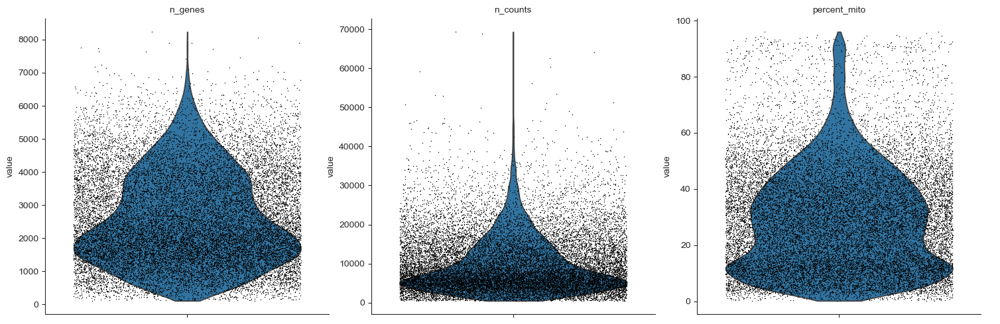

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case1_zy


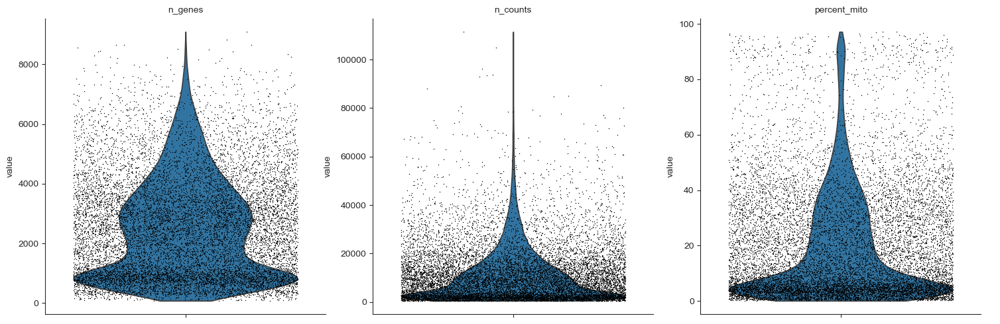

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case2_zc


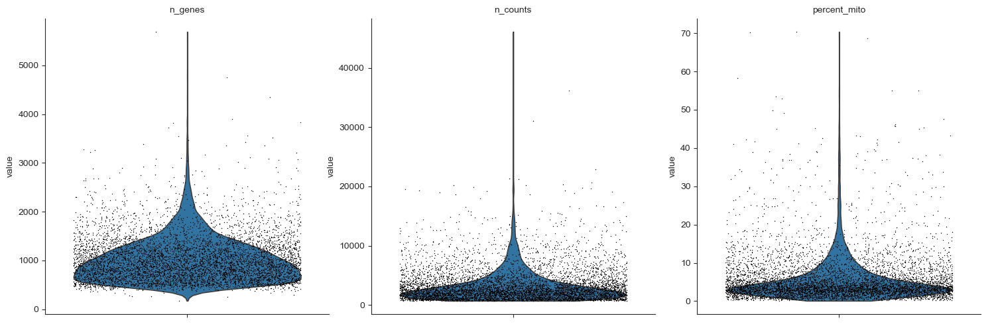

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case2_yf


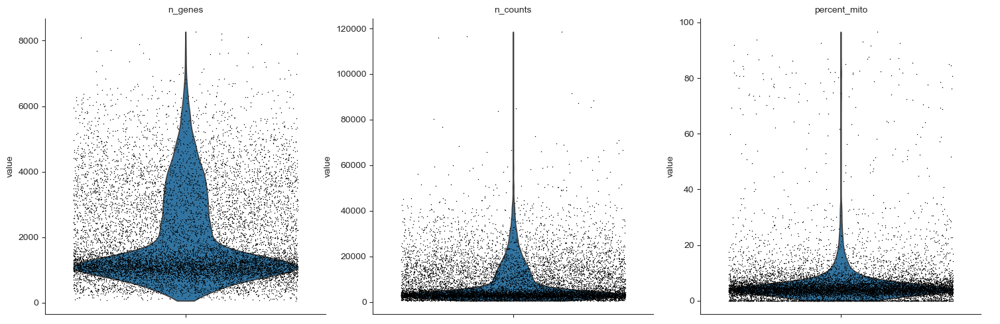

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case2_zy


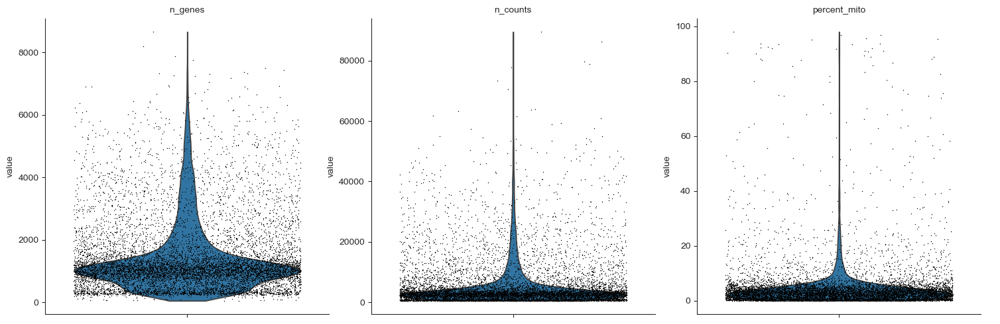

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case3_yf


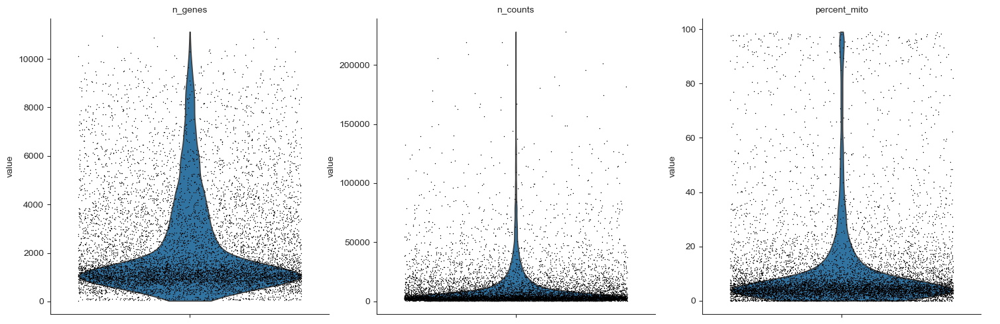

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case3_zy


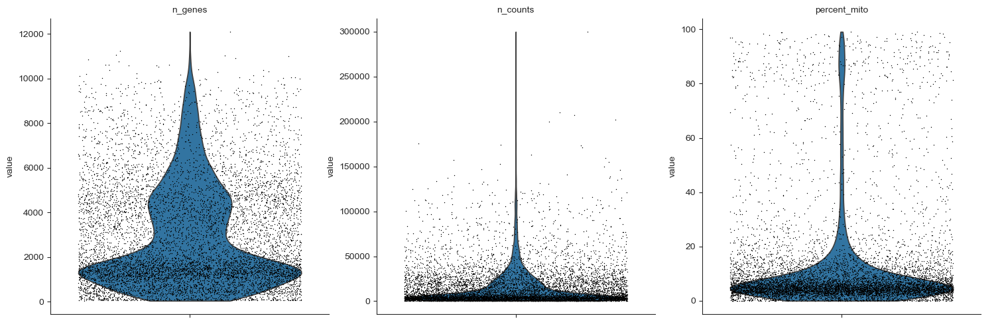

... storing 'sample' as categorical
... storing 'feature_types' as categorical


case4_zy


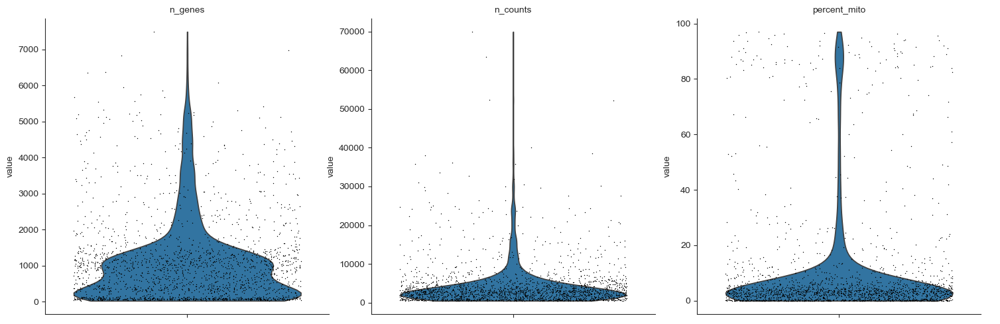

In [115]:
# Violin plots

for sample in sample_paths.keys():
    adata = adatas[sample]
    print(sample)
    sc.pl.violin(
    adata,
    ["n_genes", "n_counts", "percent_mito"],
    jitter=0.4,
    multi_panel=True,
)

#### Double detection tool

In [116]:
summary = []
temp = []
for sample in sample_paths.keys():
    print(sample)
    adata = adatas[sample]

    # Record before filtering
    pre_cells = adata.n_obs
    pre_genes = adata.n_vars

    # Filtering
    sc.pp.filter_cells(adata, min_genes=100)
    sc.pp.filter_genes(adata, min_cells=3)

    # Doublet detection
    scrub = scr.Scrublet(adata.X)
    doublet_scores, predicted_doublets = scrub.scrub_doublets()
    adata.obs['doublet_score'] = doublet_scores
    adata.obs['predicted_doublet'] = predicted_doublets

    # Record after filtering
    post_cells = adata.n_obs
    post_genes = adata.n_vars

    # Save info for summary table
    summary.append({
        'sample': sample,
        'cells_pre': pre_cells,
        'genes_pre': pre_genes,
        'cells_post': post_cells,
        'genes_post': post_genes,
        'n_doublets': predicted_doublets.sum()
    })


case1_yf
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.28
Detected doublet rate = 5.6%
Estimated detectable doublet fraction = 25.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 22.4%
Elapsed time: 16.5 seconds
case1_zy
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.74
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 8.0 seconds
case2_zc
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.75
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 1.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 3.9%
Elapsed time: 2.5 seconds
case2_y

In [117]:
summary_df = pd.DataFrame(summary)
summary_df

,sample,cells_pre,genes_pre,cells_post,genes_post,n_doublets
0,case1_yf,21560,33538,21560,21640,1207
1,case1_zy,13685,33538,13672,21572,0
2,case2_zc,6606,33538,6606,18492,3
3,case2_yf,11786,33538,11774,21715,2
4,case2_zy,9406,33538,9388,22523,3
5,case3_yf,9379,33538,9291,22668,1
6,case3_zy,8837,33538,8704,22971,2
7,case4_zy,2024,33538,1653,16498,0


### Filtering Thresholds and Justification
For this analysis, I applied quality control (QC) filtering thresholds commonly used in single-cell RNA sequencing (scRNA-seq) preprocessing. Specifically, I filtered:
Cells with fewer than 100 detected genes, to exclude low-complexity droplets likely containing ambient RNA or debris.
Genes not detected in at least 3 cells, to remove uninformative or noise-level features.

### Pre- and Post-Filtering Cell and Gene Counts
Answered above

### what are some potential strategies to set thresholds that don’t rely on visual inspection of plots?
We can remove genes that are do not show a variation in expression, or remove genes with more than 10 % NaN values. That will allow us to retain high quality data without visual inspection

## Normalization

In [118]:
# Concat adatas into adata
adata = ad.concat(adatas, join='outer', label='sample')
adata.obs_names_make_unique()

In [119]:
adata_celltypist = adata.copy()

Normalize total counts per cell: Each cell's total count is scaled to a target of 10,000. This step adjusts for sequencing depth and technical differences between cells.

Logarithmic transformation (log1p): Applies a log-transformation to stabilized variance, using the formula log(x + 1), which helps downstream methods like PCA and clustering by reducing the influence of highly expressed genes.

In [120]:
# Normalize total counts to 10,000 per cell
sc.pp.normalize_total(adata, target_sum=1e4)

# Logarithmic transformation
sc.pp.log1p(adata)


In [121]:
adata

AnnData object with n_obs × n_vars = 82648 × 25875
    obs: 'n_genes', 'n_counts', 'percent_mito', 'sample', 'doublet_score', 'predicted_doublet'
    uns: 'log1p'

Cool notes:
pp is preprocessing.
tl is tools.
pl is for plotting.
Scanpy is a very organized library.

## Feature Selection

We used the 'seurat_v3' method for identifying highly variable genes, which models the variance as a function of mean expression using regularized negative binomial models.

In [122]:
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=10000)

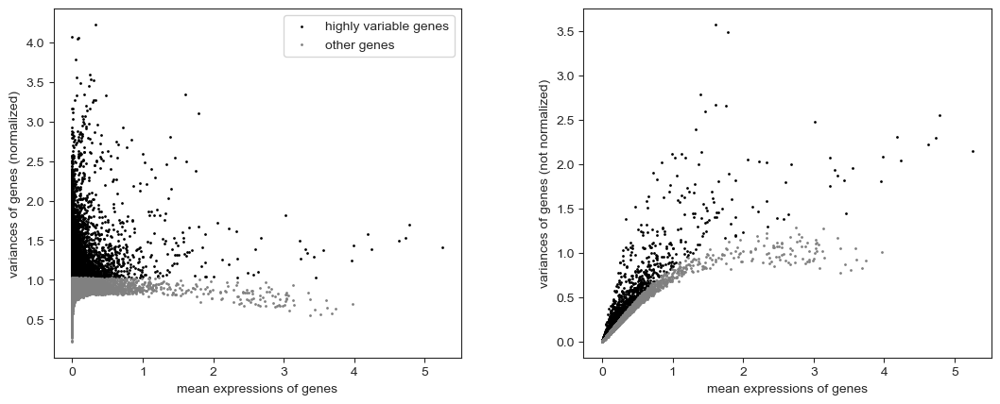

In [123]:
# Plot highly variable genes
sc.pl.highly_variable_genes(adata)


In [124]:
n_hvg = adata.var['highly_variable'].sum()
n_nonhvg = (~adata.var['highly_variable']).sum()
print(f"Highly variable genes: {n_hvg}, Non-variable genes: {n_nonhvg}")


Highly variable genes: 10000, Non-variable genes: 15875


### PCA

In [125]:
adata.obs_names_make_unique()
adata = adata[:, adata.var['highly_variable']].copy()

# Scale data and run PCA
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')


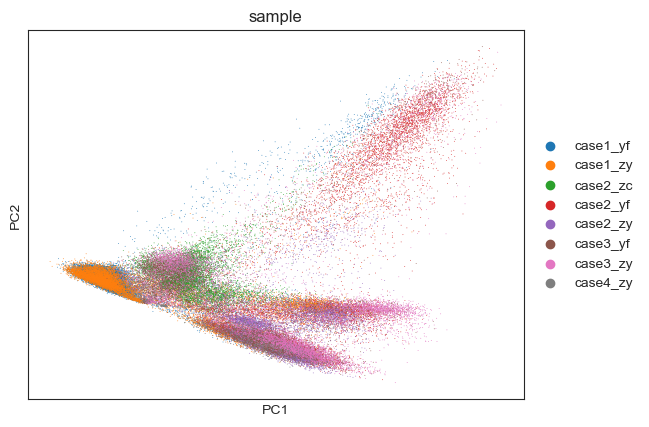

In [126]:
# Plot PCA
sc.pl.pca(adata, color='sample')

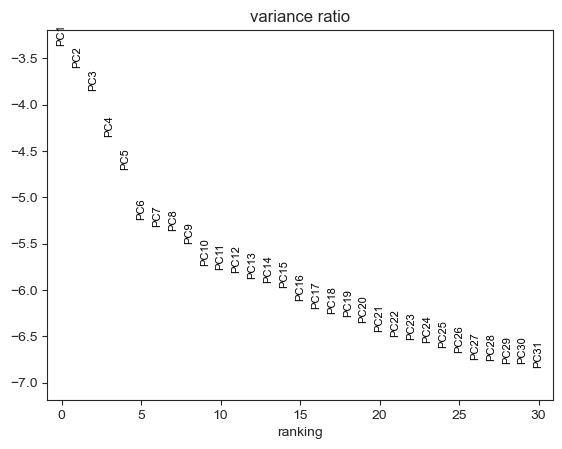

In [127]:
# Elbow plot
sc.pl.pca_variance_ratio(adata, log=True)

### UMAP

In [128]:
# Find neighbours and cludter by leiden clustering
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata, resolution=0.5)

In [129]:
sc.tl.umap(adata)

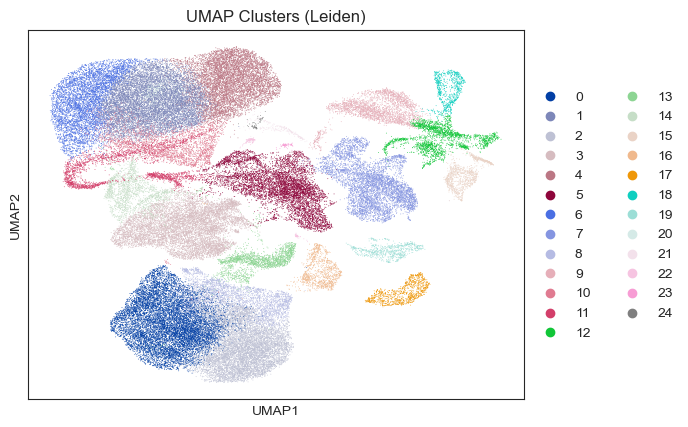

In [130]:
sc.pl.umap(adata, color='leiden', title='UMAP Clusters (Leiden)')

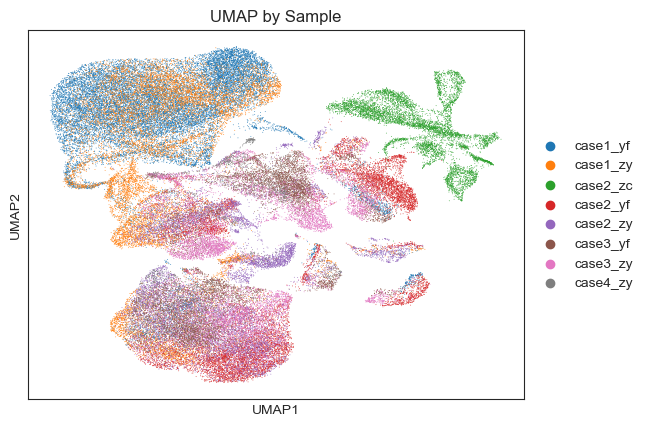

In [131]:
sc.pl.umap(adata, color='sample', title='UMAP by Sample')

### tSNE

In [132]:
sc.tl.tsne(adata)

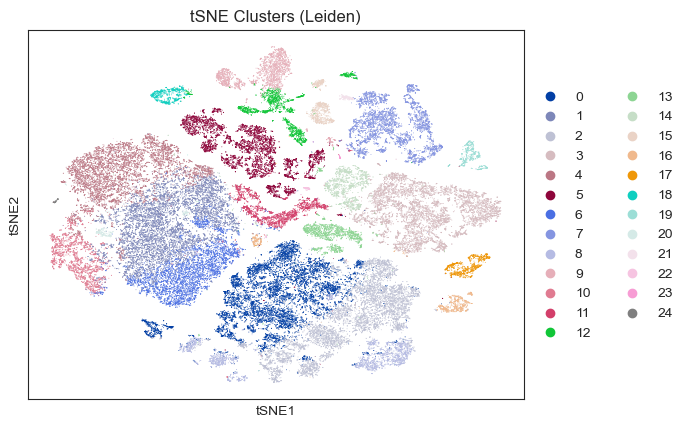

In [133]:
sc.pl.tsne(adata, color='leiden', title='tSNE Clusters (Leiden)')

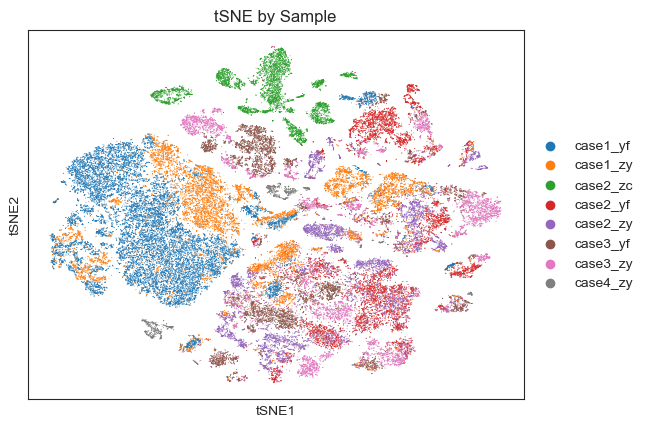

In [134]:
sc.pl.tsne(adata, color='sample', title='tSNE by Sample')

### How many cells come from each sample individually? How many total cells present in the entire dataset?

In [135]:
adata.obs['sample'].value_counts()

case1_yf    21560
case1_zy    13672
case2_yf    11774
case2_zy     9388
case3_yf     9291
case3_zy     8704
case2_zc     6606
case4_zy     1653
Name: sample, dtype: int64

### How many clusters are present?
29 (0 - 28)

### What clustering resolution did you use?
0.5

### Use the second plot you created and briefly remark on whether you will perform integration.
UMAP showed mixed data points across the clusters, except one sample, but for tSNE, the samples have more of less different sub-clusters in bigger clusters, which are mixed up. Integration might be necessary to remove batch effects completely.

## Integration (using harmonypy)

In [136]:
adata.obs

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet,leiden
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False,6
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True,4
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False,4
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False,6
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True,7
...,...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,759.0,0.922266,case4_zy,0.055944,False,13
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy,0.041096,False,0
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy,0.049505,False,5
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy,0.055944,False,5


In [137]:
# Visualizing batch effect
%time

# Run Harmony
ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, 'sample')

# Replace PCA with Harmony-corrected data
adata.obsm['X_pca_harmony'] = ho.Z_corr.T

# Use Harmony PCA for UMAP and neighbors
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, use_rep='X_pca')
sc.tl.umap(adata)

2025-05-07 23:08:05,826 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...


CPU times: user 1 μs, sys: 0 ns, total: 1 μs
Wall time: 3.1 μs


2025-05-07 23:08:12,295 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-05-07 23:08:12,458 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-05-07 23:08:26,461 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-05-07 23:08:39,604 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-05-07 23:08:53,620 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-05-07 23:09:06,841 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2025-05-07 23:09:22,225 - harmonypy - INFO - Converged after 5 iterations
Converged after 5 iterations


In [138]:
sc.tl.leiden(adata, resolution=0.6)

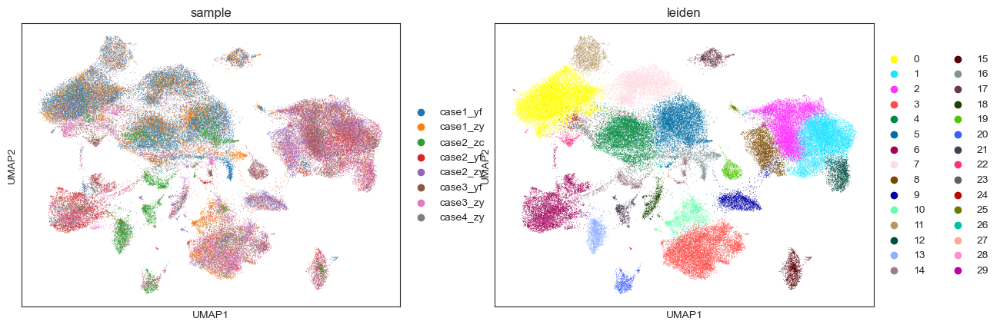

In [139]:
# plot
sc.pl.umap(adata, color=['sample','leiden'])

## Find Marker genes

In [140]:
# Find marker genes
sc.tl.rank_genes_groups(adata, 'leiden', metric='logreg')

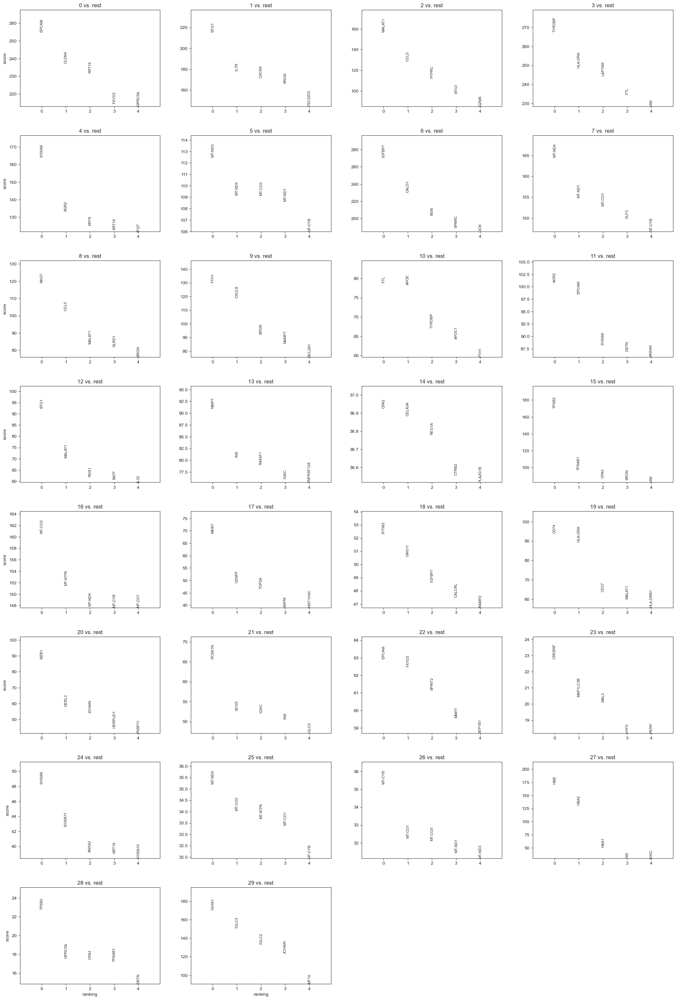

In [141]:
# Plot the top 5 genes
sc.pl.rank_genes_groups(adata, n_genes=5,sharey=False)

In [142]:
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers['pvals_adj'] < 0.05) & (markers['logfoldchanges'] > 0.5)]
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
5776,0,GSTA2,-2.135559,0.791741,0.032728,0.049520
5777,0,PIFO,-2.150644,0.578148,0.031517,0.047732
5789,0,POC1B-AS1,-2.179005,1.992555,0.029342,0.044578
5794,0,AL136295.5,-2.196317,2.945589,0.028080,0.042747
5796,0,FANCM,-2.200158,2.209998,0.027806,0.042362
...,...,...,...,...,...,...
299946,29,CDK5RAP2,-85.686440,13.420525,0.000000,0.000000
299948,29,PODXL,-86.238586,10.820836,0.000000,0.000000
299953,29,MMP1,-87.445152,14.939848,0.000000,0.000000
299960,29,LRG1,-92.325325,11.390241,0.000000,0.000000


Advantages:
Suitable for multiple groups: Logistic regression is well-suited for analyzing data with more than two groups.
Can handle complex relationships: It can model more complex relationships between genes and groups.

Disadvantages:
More complex to interpret: The results of logistic regression can be more complex to interpret than those of the t-test or Wilcoxon test.
Requires more data: Logistic regression generally requires larger sample sizes than the t-test or Wilcoxon test

## Automated Annotation

The method used for this is celltypist. CellTypist uses logistic regression-based classification models trained on curated reference datasets covering a broad range of immune and non-immune cell types. It has multiple model types specific to each condition or organ or cell types.
For annotation, we used the Immune_All_Low.pkl model, suitable for a broad range of immune cell types, particularly relevant given the tumor microenvironment focus of the dataset.

Advantages:
Fast and scalable for large datasets.
Reproducible and standardized.
Broad reference database coverage.

Limitations:
Accuracy is constrained by the reference model.
May miss rare or novel cell types not represented in training data.
Requires normalized, log-transformed expression input.

Domínguez Conde, C., et al. (2022). Cross-tissue immune cell analysis reveals tissue-specific features in humans. Science, 376(6594), eabl5197.
https://doi.org/10.1126/science.abl5197

In [143]:
adata_celltypist.layers["n_counts"] = adata_celltypist.X.copy()
adata_celltypist.obs_names_make_unique()
adata_celltypist.var_names_make_unique()

In [144]:
adata_celltypist.obs

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True
...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,759.0,0.922266,case4_zy,0.055944,False
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy,0.041096,False
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy,0.049505,False
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy,0.055944,False


In [145]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_COVID19_PBMC.pkl,peripheral blood mononuclear cell types from C...
3,Adult_CynomolgusMacaque_Hippocampus.pkl,cell types from the hippocampus of adult cynom...
4,Adult_Human_MTG.pkl,cell types and subtypes (10x-based) from the a...
5,Adult_Human_PancreaticIslet.pkl,cell types from pancreatic islets of healthy a...
6,Adult_Human_PrefrontalCortex.pkl,cell types and subtypes from the adult human d...
7,Adult_Human_Skin.pkl,cell types from human healthy adult skin
8,Adult_Human_Vascular.pkl,vascular populations combined from multiple ad...
9,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...


In [146]:
# Step 1: Normalize to 10,000 counts per cell
sc.pp.normalize_total(adata_celltypist, target_sum=1e4)

# Step 2: Log1p transform
sc.pp.log1p(adata_celltypist)

In [147]:
# Check type
adata_celltypist

AnnData object with n_obs × n_vars = 82648 × 25875
    obs: 'n_genes', 'n_counts', 'percent_mito', 'sample', 'doublet_score', 'predicted_doublet'
    uns: 'log1p'
    layers: 'n_counts'

In [148]:
# Add the labels to all genes
predictions = celltypist.annotate(adata_celltypist, model = 'Immune_All_Low.pkl', majority_voting = True)
predictions

🔬 Input data has 82648 cells and 25875 genes
🔗 Matching reference genes in the model
🧬 5851 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


CellTypist prediction result for 82648 query cells
    predicted_labels: data frame with 3 columns ('predicted_labels', 'over_clustering', 'majority_voting')
    decision_matrix: data frame with 82648 query cells and 98 cell types
    probability_matrix: data frame with 82648 query cells and 98 cell types
    adata: AnnData object referred

In [149]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCCAAGAGCACTG-1,Epithelial cells,218,Epithelial cells
AAACCCAAGCTAATCC-1,Epithelial cells,43,Epithelial cells
AAACCCAAGGCTGTAG-1,Epithelial cells,117,Epithelial cells
AAACCCAAGTTGAATG-1,Epithelial cells,113,Epithelial cells
AAACCCACAAACAGGC-1,Epithelial cells,37,Epithelial cells
...,...,...,...
TTTGGAGCAACTTGGT-1,Monocytes,310,Intermediate macrophages
TTTGGAGCAGTTCCAA-1,Tem/Trm cytotoxic T cells,25,Tem/Trm cytotoxic T cells
TTTGTTGAGGGCAGTT-1,Tcm/Naive helper T cells,142,Tcm/Naive helper T cells
TTTGTTGCAAGTGCAG-1,Memory B cells,142,Tcm/Naive helper T cells


In [150]:
# Add predictions to your object (UNCOMMENT WHEN RUNNING FOR THE FIRST TIME)
adata_celltypist.obs = adata_celltypist.obs.join(predictions.predicted_labels)

# Prepare to visualize with UMAP
sc.pp.neighbors(adata_celltypist)
sc.tl.umap(adata_celltypist)
sc.tl.leiden(adata_celltypist, resolution=0.6)

In [151]:
adata_celltypist.obs

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet,predicted_labels,over_clustering,majority_voting,leiden
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False,Epithelial cells,218,Epithelial cells,4
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True,Epithelial cells,43,Epithelial cells,2
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False,Epithelial cells,117,Epithelial cells,2
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False,Epithelial cells,113,Epithelial cells,9
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True,Epithelial cells,37,Epithelial cells,6
...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,759.0,0.922266,case4_zy,0.055944,False,Monocytes,310,Intermediate macrophages,11
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy,0.041096,False,Tem/Trm cytotoxic T cells,25,Tem/Trm cytotoxic T cells,13
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy,0.049505,False,Tcm/Naive helper T cells,142,Tcm/Naive helper T cells,13
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy,0.055944,False,Memory B cells,142,Tcm/Naive helper T cells,13


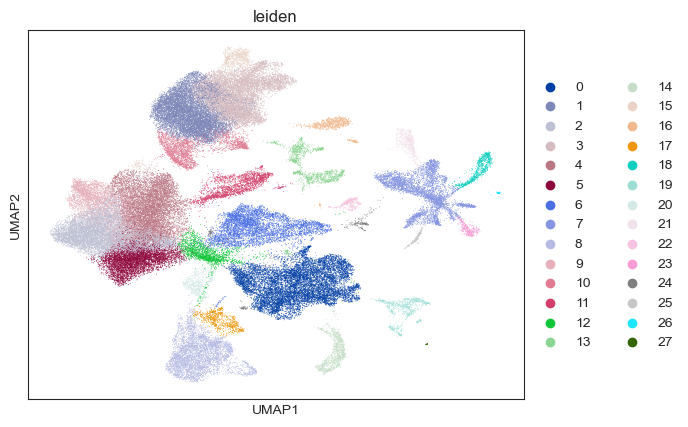

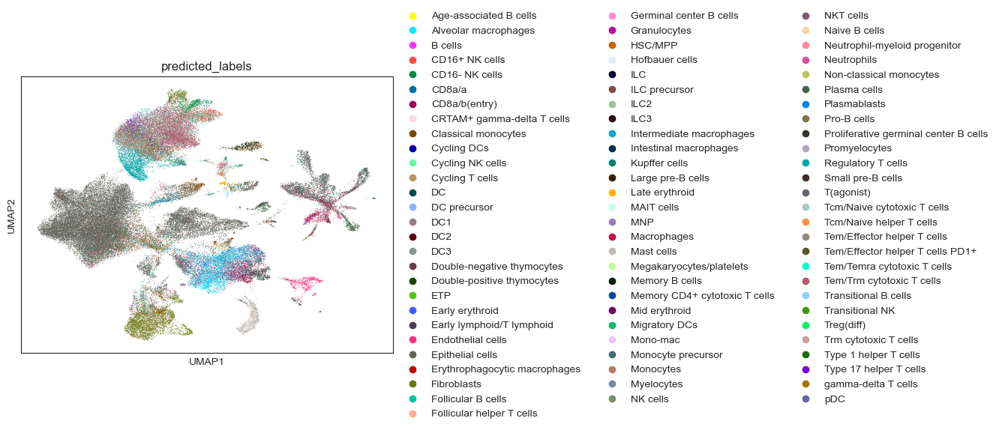

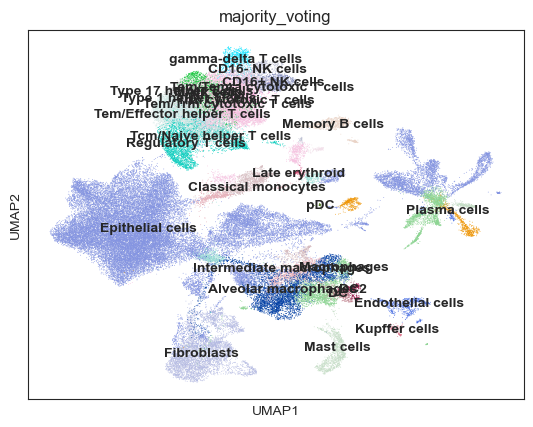

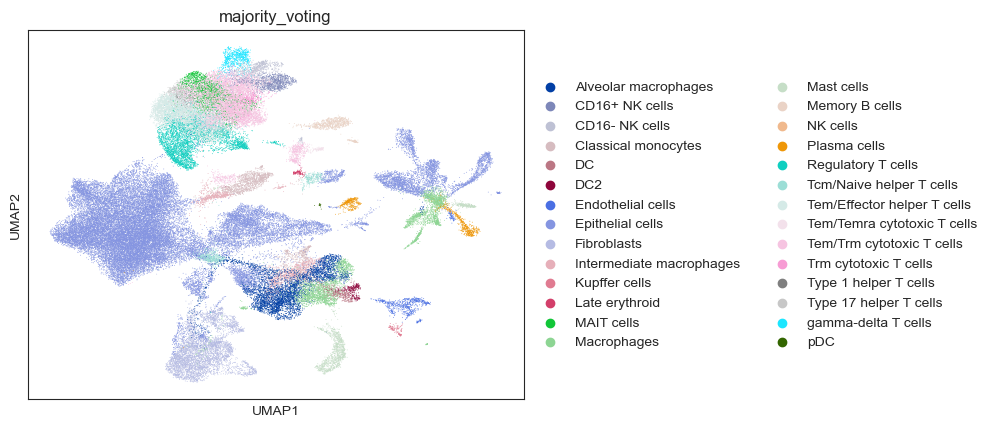

In [152]:
sc.pl.umap(adata_celltypist, color=['leiden'])
sc.pl.umap(adata_celltypist, color=['predicted_labels'])
sc.pl.umap(adata_celltypist, color=['majority_voting'], legend_loc='on data')
sc.pl.umap(adata_celltypist, color=['majority_voting'])

predominantly epithelial, fibroblasts.
NK cells

## Manual Annotation

In [153]:
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
5776,0,GSTA2,-2.135559,0.791741,0.032728,0.049520
5777,0,PIFO,-2.150644,0.578148,0.031517,0.047732
5789,0,POC1B-AS1,-2.179005,1.992555,0.029342,0.044578
5794,0,AL136295.5,-2.196317,2.945589,0.028080,0.042747
5796,0,FANCM,-2.200158,2.209998,0.027806,0.042362
...,...,...,...,...,...,...
299946,29,CDK5RAP2,-85.686440,13.420525,0.000000,0.000000
299948,29,PODXL,-86.238586,10.820836,0.000000,0.000000
299953,29,MMP1,-87.445152,14.939848,0.000000,0.000000
299960,29,LRG1,-92.325325,11.390241,0.000000,0.000000


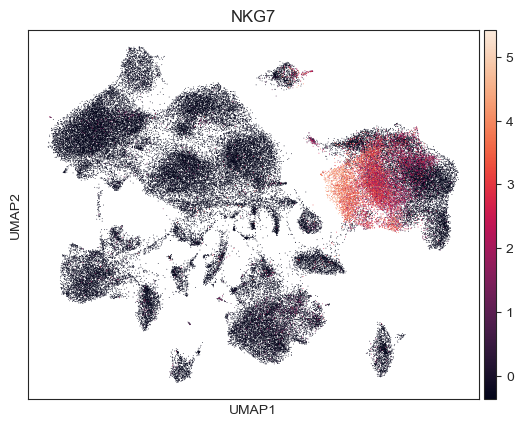

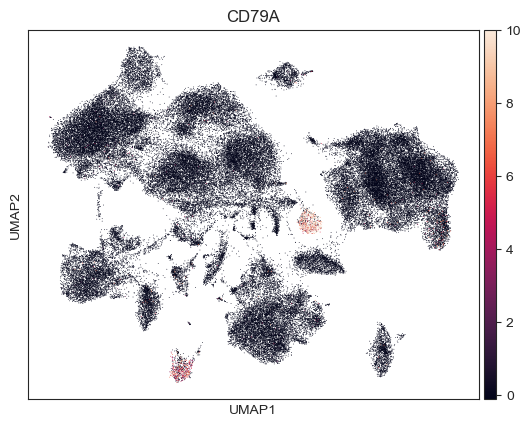

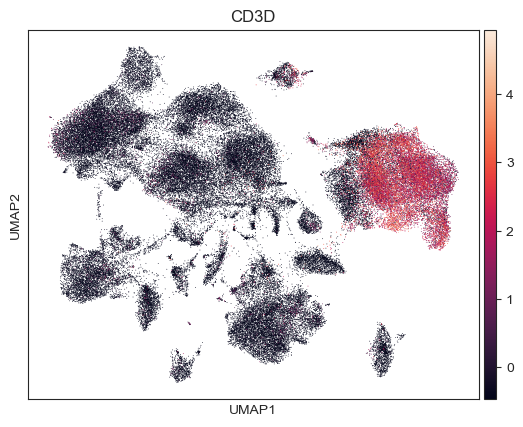

In [154]:
# For NK cells
sc.pl.umap(adata, color='NKG7', legend_loc='on data')

# For B cells
sc.pl.umap(adata, color='CD79A', legend_loc='on data')

# For T cells
sc.pl.umap(adata, color='CD3D', legend_loc='on data')

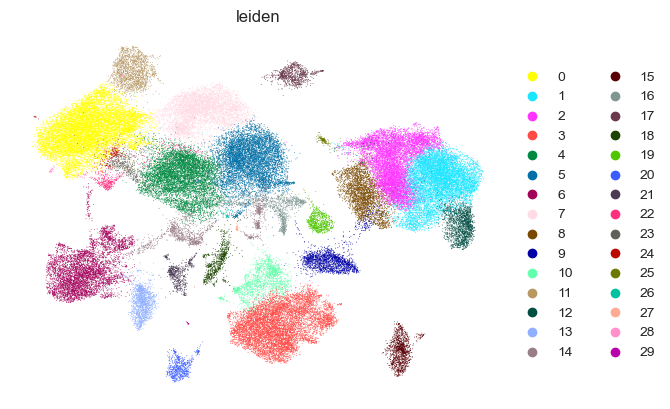

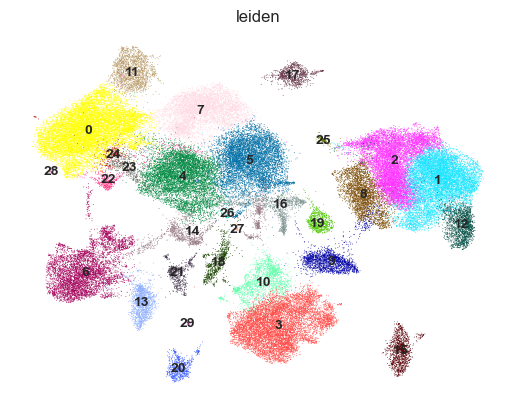

In [155]:
sc.pl.umap(adata, color=['leiden'], frameon=False)
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', frameon=False)

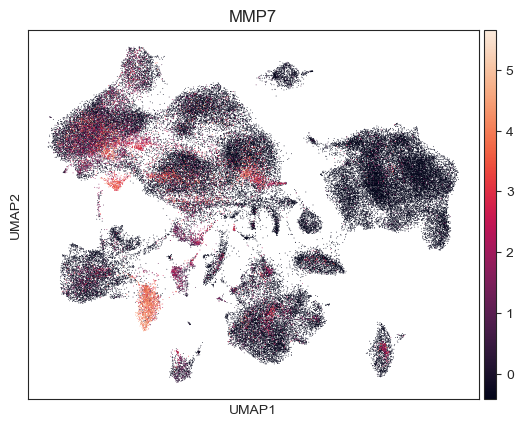

In [156]:
sc.pl.umap(adata, color='MMP7', legend_loc='on data')

Many cell markers and umap trials later...

In [157]:
# Define a dictionary to manually annotate the proteins and use it to add cluster labels
annotate = {}
for i in range(0,29):
    annotate[f'{i}'] = ""

annotate

{'0': '',
 '1': '',
 '2': '',
 '3': '',
 '4': '',
 '5': '',
 '6': '',
 '7': '',
 '8': '',
 '9': '',
 '10': '',
 '11': '',
 '12': '',
 '13': '',
 '14': '',
 '15': '',
 '16': '',
 '17': '',
 '18': '',
 '19': '',
 '20': '',
 '21': '',
 '22': '',
 '23': '',
 '24': '',
 '25': '',
 '26': '',
 '27': '',
 '28': ''}

In [158]:
# Gene names for annotation taken from the original publication (https://www.nature.com/articles/s41467-023-40727-7/figures/1)
annotate = {'0': 'Ductal Cells',
 '1': 'T cells',
 '2': 'Macrophages/Monocytes',
 '3': 'Acinar cells',
 '4': 'Ductal Cells',
 '5': 'Fibroblasts',
 '6': 'T cells',
 '7': 'Acinar cells',
 '8': 'NK cells',
 '9': 'T cells',
 '10': 'Macrophages/Monocytes',
 '11': 'Plasma Cells',
 '12': 'Macrophages/Monocytes',
 '13': 'MK167+ cell',
 '14': 'Macrophages/Monocytes',
 '15': 'Mast cells',
 '16': 'Ductal Cells',
 '17': 'MK167+ cell',
 '18': 'Endothelial cells',
 '19': 'B cells',
 '20': 'Plasma cells',
 '21': 'Plasma cells',
 '22': 'Ductal Cells',
 '23': 'Ductal Cells',
 '24': 'Macrophages/Monocytes',
 '25': 'Uncertain',
 '26': 'T cells',
 '27': 'Endothelial cells',
 '28': 'Endothelial cells'}

In [159]:
adata.obs

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet,leiden
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False,5
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True,0
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False,0
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False,7
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True,13
...,...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,759.0,0.922266,case4_zy,0.055944,False,9
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy,0.041096,False,2
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy,0.049505,False,5
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy,0.055944,False,4


In [160]:
# Assign cell type to each cluster
adata.obs['celltype'] = adata.obs['leiden'].map(annotate)

... storing 'celltype' as categorical


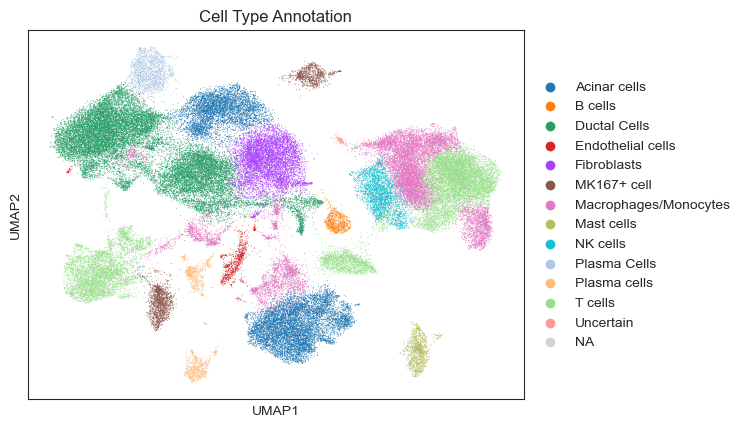

In [161]:
# Visualize UMAP with cell types
sc.pl.umap(adata, color='celltype', title='Cell Type Annotation')


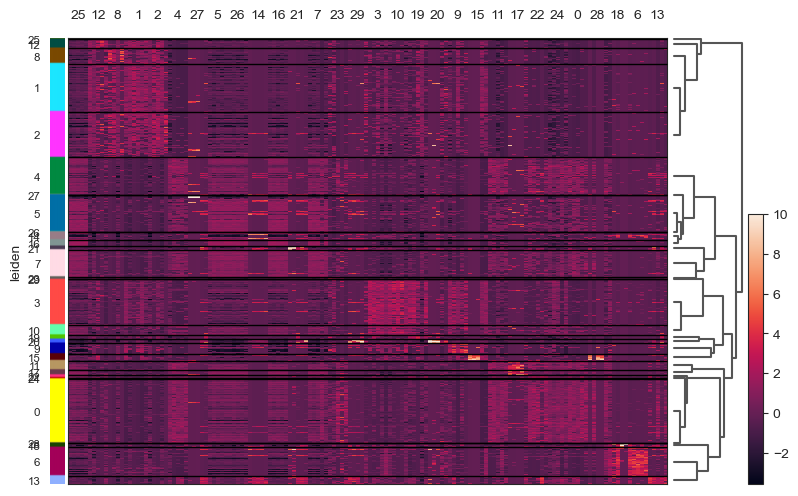

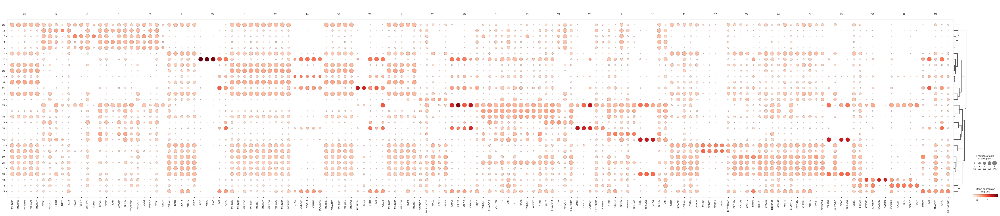

In [162]:
# Plot top 5 genes from each cluster as a heatmap and dot plot
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, groupby='leiden', show=True)
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby='leiden', show=True)


In [163]:
# Find top 3 populous clusters
top_clusters = adata.obs['leiden'].value_counts().head(3).index.tolist()
print("Top clusters:", top_clusters)

sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')  # if not already done
top_markers = {}
for cluster in top_clusters:
    top = adata.uns['rank_genes_groups']['names'][cluster][:5]
    top_markers[cluster] = top


Top clusters: ['0', '1', '2']


In [164]:
adata.obs.columns

Index(['n_genes', 'n_counts', 'percent_mito', 'sample', 'doublet_score',
       'predicted_doublet', 'leiden', 'celltype'],
      dtype='object')

Top 5 genes from cluster 0


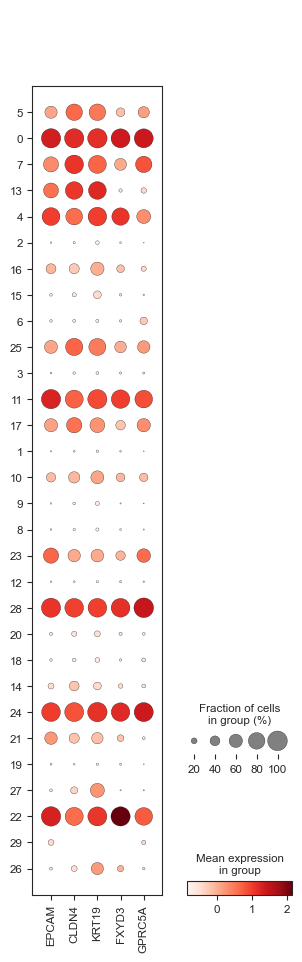

Top 5 genes from cluster 1


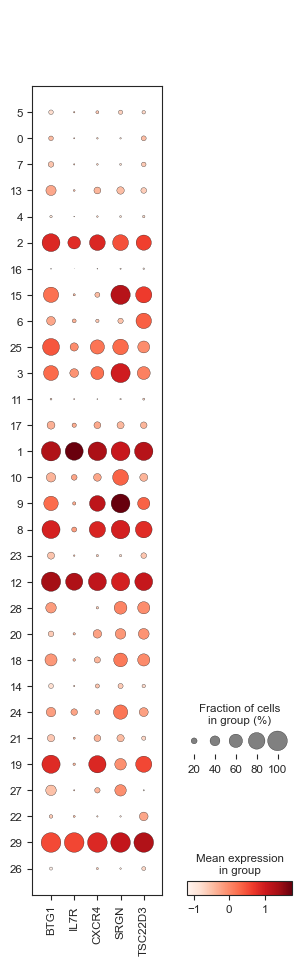

Top 5 genes from cluster 2


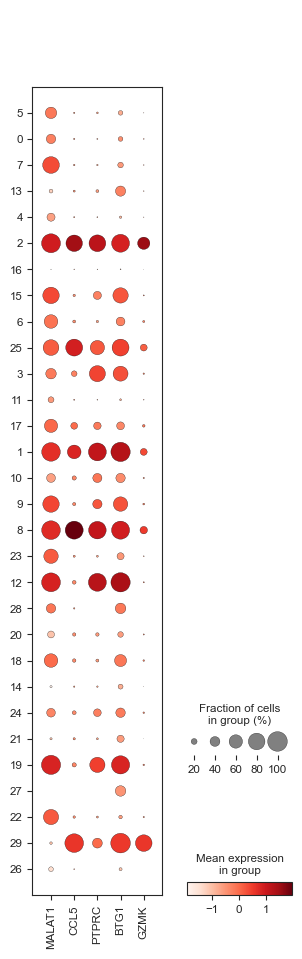

In [165]:
# Get top marker genes for cluster '0'
top_clusters = ['0', '1', '2']
for cluster in top_clusters:
    print('Top 5 genes from cluster', cluster)
    genes = adata.uns['rank_genes_groups']['names'][cluster][:5]
    sc.pl.dotplot(adata, var_names=genes, groupby='leiden')


Each cluster is annotated by referring to the original article. They had a heatmap with marker genes and associated cell types. I used that as my reference list.

Marker genes : https://www.nature.com/articles/s41467-023-40727-7#Fig1

Method to manually annotate: inclass and this cool YT video https://www.youtube.com/watch?v=uvyG9yLuNSE&t=2874s

## Pseudotime Analysis (PAGA and dpt)

In [166]:
# select Ductal cells
subset = adata[adata.obs['celltype'] == 'Ductal Cells'].copy()

In [167]:
subset

AnnData object with n_obs × n_vars = 20848 × 10000
    obs: 'n_genes', 'n_counts', 'percent_mito', 'sample', 'doublet_score', 'predicted_doublet', 'leiden', 'celltype'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'tsne', 'rank_genes_groups', 'celltype_colors', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [168]:
print(subset.shape)
print("Subclusters in Ductal cells: \n",subset.obs['leiden'].unique())
print(subset.obs['leiden'].value_counts())

(20848, 10000)
Subclusters in Ductal cells: 
 ['0', '4', '16', '23', '22']
Categories (5, object): ['0', '4', '16', '22', '23']
0     11834
4      6873
16     1181
22      491
23      469
Name: leiden, dtype: int64


In [169]:
# Preprocess and prepare data 
sc.pp.highly_variable_genes(subset, n_top_genes=2000)
subset = subset[:, subset.var.highly_variable]

In [170]:
sc.pp.scale(subset, max_value=10)
sc.tl.pca(subset, svd_solver='arpack')
sc.tl.umap(subset)

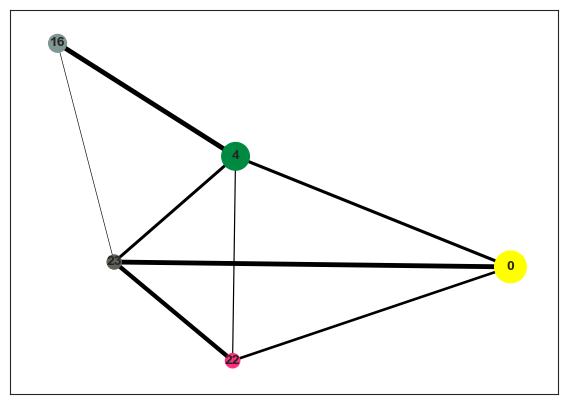

In [171]:
# Recompute neighbors using same parameters
sc.pp.neighbors(subset, n_neighbors=10, n_pcs=30)

# Run PAGA
sc.tl.paga(subset, groups='leiden')
sc.pl.paga(subset, plot=True)


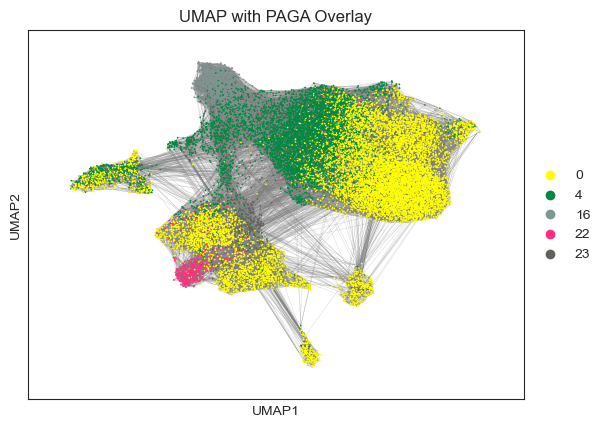

In [172]:
# Use PAGA positions to initialize UMAP
sc.tl.umap(subset, init_pos='paga')

# Plot UMAP with PAGA overlay
sc.pl.umap(subset, color=['leiden'], edges=True, title='UMAP with PAGA Overlay')

### Figures from publication (Figure 3c)

In [181]:
sc.tl.diffmap(subset)


In [179]:
root_ixs = subset.obsm['X_diffmap'][:, 3].argmax()
subset.obsm['X_diffmap'][:, 3].argmax()

20789

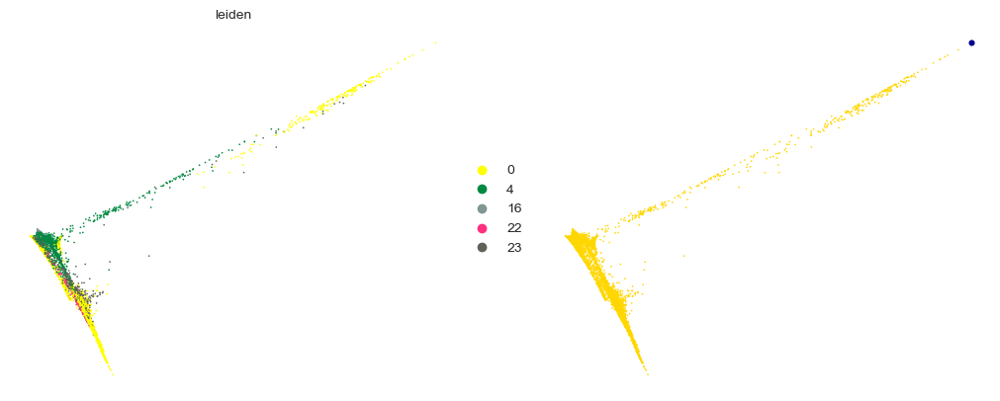

In [186]:
scv.pl.scatter(
    subset,
    basis="diffmap",
    c=["leiden", root_ixs],
    legend_loc="right",
    components=["2, 3"],
)

subset.uns["iroot"] = root_ixs

In [188]:
sc.tl.dpt(subset)

In [189]:
# Prepare data for sample_groups visualization
subset.obs['sample'].unique()
def map_sample_to_group(sample_name):
    if '_zc' in sample_name:
        return 'NT'
    elif '_yf' in sample_name:
        return 'PT'
    elif '_zy' in sample_name:
        return 'HM'
    else:
        return 'Unknown'

subset.obs['sample_group'] = subset.obs['sample'].apply(map_sample_to_group)

subset.obs['sample_group'].value_counts()

PT    13439
HM     6443
NT      966
Name: sample_group, dtype: int64

In [190]:
# Define cell states using Pandas
subset.obs['cell_state'] = pd.qcut(subset.obs['dpt_pseudotime'], q=5, labels=['S1', 'S2', 'S3', 'S4', 'S5'])

In [193]:
subset.var_names

Index(['A1BG', 'A2M-AS1', 'A2ML1', 'AAK1', 'ABCC11', 'ABCC8', 'ABCD2', 'ABCG1',
       'ABCG8', 'ABHD15-AS1',
       ...
       'ZNF683', 'ZNF750', 'ZNF80', 'ZNF804B', 'ZNF98', 'ZNRF3-AS1', 'ZPBP2',
       'ZPLD1', 'ZRANB2-AS1', 'ZSCAN10'],
      dtype='object', length=2000)

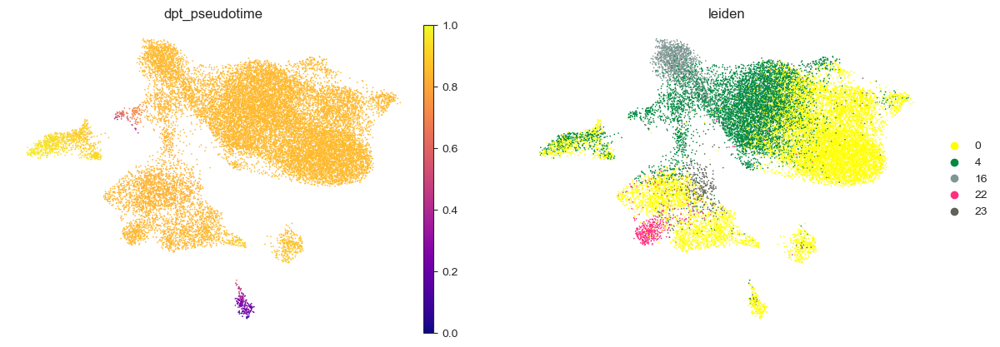

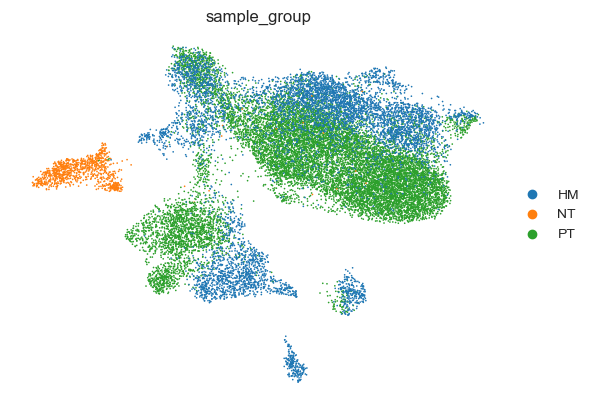

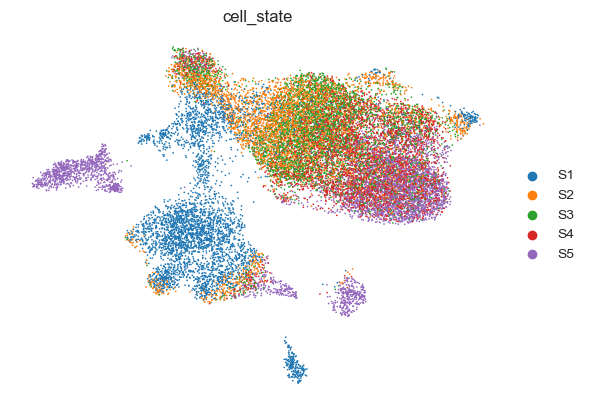

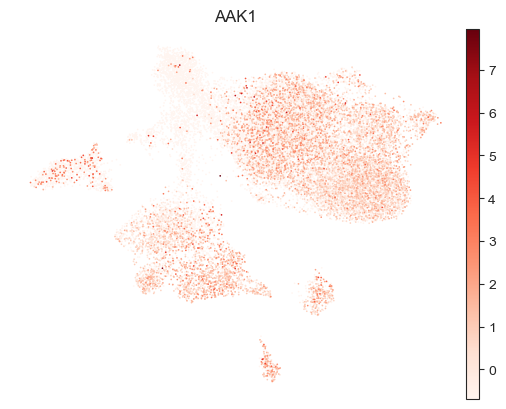

In [203]:
sc.pl.umap(subset, color=['dpt_pseudotime','leiden'], color_map='plasma', frameon=False)
sc.pl.umap(subset,color='sample_group',color_map='plasma', frameon=False)
sc.pl.umap(subset, color='cell_state', color_map='plasma', frameon=False)
sc.pl.umap(subset, color='AAK1', color_map='Reds', frameon=False)

In the orignal article, authors used monocle2, but here, PAGA and dpt are used. from the above figures, NT cells were confined to S2 cell_state. NT cells are completely differentiable in the above UMAP. S5 has all the NT cells, but it also includes other cells.
Zhang, S., Fang, W., Zhou, S. et al. Single cell transcriptomic analyses implicate an immunosuppressive tumor microenvironment in pancreatic cancer liver metastasis. Nat Commun 14, 5123 (2023). https://doi.org/10.1038/s41467-023-40727-7

## Cell-Cell Interaction analysis (CellPhoneDB)

In [204]:
# Installing cellphonedb using instructions from (https://github.com/ventolab/CellphoneDB/blob/master/notebooks/T0_DownloadDB.ipynb)
from IPython.display import HTML, display
from cellphonedb.utils import db_releases_utils
from cellphonedb.utils import db_utils
import os

display(HTML(db_releases_utils.get_remote_database_versions_html()['db_releases_html_table']))

# -- Version of the database
cpdb_version = 'v5.0.0'

# -- Path where the input files to generate the database are located
cpdb_target_dir = os.path.join('', cpdb_version)

db_utils.download_database(cpdb_target_dir, cpdb_version)

Downloaded cellphonedb.zip into v5.0.0
Downloaded complex_input.csv into v5.0.0
Downloaded gene_input.csv into v5.0.0
Downloaded interaction_input.csv into v5.0.0
Downloaded protein_input.csv into v5.0.0
Downloaded uniprot_synonyms.tsv into v5.0.0/sources
Downloaded transcription_factor_input.csv into v5.0.0/sources


In [205]:
adata

AnnData object with n_obs × n_vars = 82648 × 10000
    obs: 'n_genes', 'n_counts', 'percent_mito', 'sample', 'doublet_score', 'predicted_doublet', 'leiden', 'celltype'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'tsne', 'rank_genes_groups', 'celltype_colors', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [206]:
# prepare data
adata.var_names_make_unique()


In [207]:
# Cell metadata file
meta = adata.obs[['celltype']].copy()
meta.reset_index(inplace=True)
meta.columns = ['Cell', 'celltype']
meta.to_csv("cellphone_meta.txt", sep="\t", index=False)

In [208]:
# Expression matrix (genes x cells)
# TAKES 7-10 MINUTES

#expr = adata.to_df().T
#expr.to_csv("cellphone_counts.txt", sep="\t")

In [209]:
meta.head()

,Cell,celltype
0,AAACCCAAGAGCACTG-1,Fibroblasts
1,AAACCCAAGCTAATCC-1,Ductal Cells
2,AAACCCAAGGCTGTAG-1,Ductal Cells
3,AAACCCAAGTTGAATG-1,Acinar cells
4,AAACCCACAAACAGGC-1,MK167+ cell


In [ ]:
# DO NOT RUN AGAIN UNLESS expr CHANGED
# expr.head()

In [ ]:
cpdb_results = cpdb_analysis_method.call(
        cpdb_file_path = 'v5.0.0/cellphonedb.zip',
        meta_file_path = 'cellphone_meta.txt',
        counts_file_path = 'cellphone_counts.txt',
        counts_data = 'hgnc_symbol',
        score_interactions = True,
        output_path = 'cellphonedb/')

In [ ]:
cpdb_results

### For replicating the figure 7a from the publication, we need to sort the samples according to the condition and them perform it individually

Sample codes according to https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE197177:
1. ZC: normal pancreatic tissue
2. YF: pancreatic tumors
3. ZY: hepatic metastases

In [210]:
adata.obs['sample'].unique()

['case1_yf', 'case1_zy', 'case2_zc', 'case2_yf', 'case2_zy', 'case3_yf', 'case3_zy', 'case4_zy']
Categories (8, object): ['case1_yf', 'case1_zy', 'case2_zc', 'case2_yf', 'case2_zy', 'case3_yf', 'case3_zy', 'case4_zy']

In [211]:
adata_PT = adata[adata.obs['sample'].isin(['case1_yf', 'case2_yf', 'case3_yf'])]
adata_NT = adata[adata.obs['sample'] == 'case2_zc']
adata_HM = adata[adata.obs['sample'].isin(['case1_zy', 'case2_zy', 'case3_zy', 'case4_zy'])]

print(adata.shape)
print(adata_PT.shape)
print(adata_NT.shape)
print(adata_HM.shape)

(82648, 10000)
(42625, 10000)
(6606, 10000)
(33417, 10000)


#### For PT cells

In [ ]:
meta = adata_PT.obs[['celltype']].copy()
meta.reset_index(inplace=True)
meta.columns = ['Cell', 'celltype']
meta.to_csv("pt_meta.txt", sep="\t", index=False)

expr = adata_PT.to_df().T
expr.to_csv("pt_counts.txt", sep="\t")

cpdb_results_pt = cpdb_analysis_method.call(
        cpdb_file_path = 'v5.0.0/cellphonedb.zip',
        meta_file_path = 'pt_meta.txt',
        counts_file_path = 'pt_counts.txt',
        counts_data = 'hgnc_symbol',
        score_interactions = True,
        output_path = 'cellphonedb/pt/')

In [212]:
# Heatmap visualization
means_pt = pd.read_csv('cellphonedb/pt/simple_analysis_means_result_05_07_2025_131112.txt', sep='\t')

# Select only the columns with cell-type interactions (skip first 2 columns: 'interacting_pair' and 'gene_a/gene_b')
interaction_cols = means_pt.columns[means_pt.columns.str.contains(r'\|')]

# Compute the average interaction strength between each pair of cell types
interaction_means = means_pt[interaction_cols].mean(axis=0)

# Convert to square matrix for heatmap
interaction_matrix = interaction_means.reset_index()
interaction_matrix.columns = ['cell_pair', 'mean_score']

# Split sender|receiver into two columns
interaction_matrix[['source', 'target']] = interaction_matrix['cell_pair'].str.split(r'\|', expand=True)

# Pivot into matrix
heatmap_pt = interaction_matrix.pivot(index='source', columns='target', values='mean_score').fillna(0)


#### For NT cells

In [ ]:
meta = adata_NT.obs[['celltype']].copy()
meta.reset_index(inplace=True)
meta.columns = ['Cell', 'celltype']
meta.to_csv("nt_meta.txt", sep="\t", index=False)

expr = adata_NT.to_df().T
expr.to_csv("nt_counts.txt", sep="\t")

cpdb_results_nt = cpdb_analysis_method.call(
        cpdb_file_path = 'v5.0.0/cellphonedb.zip',
        meta_file_path = 'nt_meta.txt',
        counts_file_path = 'nt_counts.txt',
        counts_data = 'hgnc_symbol',
        score_interactions = True,
        output_path = 'cellphonedb/nt/')

In [213]:
# Heatmap visualization
means_nt = pd.read_csv('cellphonedb/nt/simple_analysis_means_result_05_07_2025_131135.txt', sep='\t')

# Select only the columns with cell-type interactions (skip first 2 columns: 'interacting_pair' and 'gene_a/gene_b')
interaction_cols = means_nt.columns[means_nt.columns.str.contains(r'\|')]

# Compute the average interaction strength between each pair of cell types
interaction_means = means_nt[interaction_cols].mean(axis=0)

# Convert to square matrix for heatmap
interaction_matrix = interaction_means.reset_index()
interaction_matrix.columns = ['cell_pair', 'mean_score']

# Split sender|receiver into two columns
interaction_matrix[['source', 'target']] = interaction_matrix['cell_pair'].str.split(r'\|', expand=True)

# Pivot into matrix
heatmap_nt = interaction_matrix.pivot(index='source', columns='target', values='mean_score').fillna(0)


#### For HM Cells

In [ ]:
meta = adata_HM.obs[['celltype']].copy()
meta.reset_index(inplace=True)
meta.columns = ['Cell', 'celltype']
meta.to_csv("hm_meta.txt", sep="\t", index=False)

expr = adata_HM.to_df().T
expr.to_csv("hm_counts.txt", sep="\t")

cpdb_results_hm = cpdb_analysis_method.call(
        cpdb_file_path = 'v5.0.0/cellphonedb.zip',
        meta_file_path = 'hm_meta.txt',
        counts_file_path = 'hm_counts.txt',
        counts_data = 'hgnc_symbol',
        output_path = 'cellphonedb/hm/')

In [214]:
# Heatmap visualization
means_hm = pd.read_csv('cellphonedb/hm/simple_analysis_means_result_05_07_2025_132311.txt', sep='\t')

# Select only the columns with cell-type interactions (skip first 2 columns: 'interacting_pair' and 'gene_a/gene_b')
interaction_cols = means_hm.columns[means_hm.columns.str.contains(r'\|')]

# Compute the average interaction strength between each pair of cell types
interaction_means = means_hm[interaction_cols].mean(axis=0)

# Convert to square matrix for heatmap
interaction_matrix = interaction_means.reset_index()
interaction_matrix.columns = ['cell_pair', 'mean_score']

# Split sender|receiver into two columns
interaction_matrix[['source', 'target']] = interaction_matrix['cell_pair'].str.split(r'\|', expand=True)

# Pivot into matrix
heatmap_hm = interaction_matrix.pivot(index='source', columns='target', values='mean_score').fillna(0)


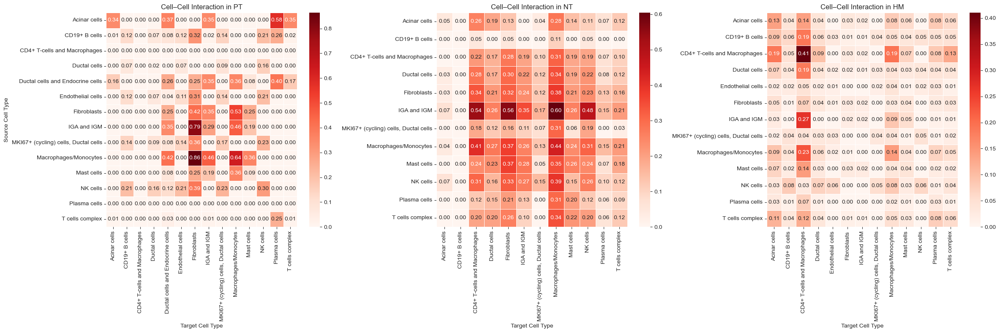

In [215]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns

# PT heatmap
sns.heatmap(heatmap_pt, cmap='Reds', linewidths=0.5, annot=True, fmt=".2f", ax=axs[0])
axs[0].set_title('Cell–Cell Interaction in PT')
axs[0].set_xlabel('Target Cell Type')
axs[0].set_ylabel('Source Cell Type')

# NT heatmap
sns.heatmap(heatmap_nt, cmap='Reds', linewidths=0.5, annot=True, fmt=".2f", ax=axs[1])
axs[1].set_title('Cell–Cell Interaction in NT')
axs[1].set_xlabel('Target Cell Type')
axs[1].set_ylabel('')

# HM heatmap
sns.heatmap(heatmap_hm, cmap='Reds', linewidths=0.5, annot=True, fmt=".2f", ax=axs[2])
axs[2].set_title('Cell–Cell Interaction in HM')
axs[2].set_xlabel('Target Cell Type')
axs[2].set_ylabel('')

plt.tight_layout()
plt.show()


From the above heatmaps, the cell-cell interaction differs from sample to sample. It is the highest for NT (normal pancreatic cells). Macrophages/Monocytes also maintain moderate interaction levels with multiple cell types, including Fibroblasts and MKI67+ cells, reinforcing their potential role in tissue remodeling and repair in normal tissue contexts (Wynn TA, 2016).
In pancreatic tumour cells, the fibroblasts show the most interaction, especially with macrophages/monocytes. In the pancreatic tumor microenvironment, cancer-associated fibroblasts (CAFs) play a crucial role in interacting with tumor-associated macrophages (TAMs) (Gunaydin G. 2021). CAFs as well as TAMs are known to play pivotal supportive roles in tumor growth and progression.
For the third sample type, hepatic metastacised cells, these interactions can be either protective, promoting anti-tumor immunity, or detrimental, facilitating metastasis. CD4+ T cells can help license dendritic cells (DCs) to better present antigens to CD8+ T cells, enhancing anti-tumor CD8+ T cell responses. However, they can also contribute to immunosuppression, producing IL-22 that promotes angiogenesis and metastasis, or becoming regulatory T cells (Tregs) that suppress anti-tumor immunity (Wu K. 2024).

1. Wynn TA, Vannella KM. Macrophages in Tissue Repair, Regeneration, and Fibrosis. Immunity. 2016 Mar 15;44(3):450-462. doi: 10.1016/j.immuni.2016.02.015. PMID: 26982353; PMCID: PMC4794754.
2. Gunaydin G. CAFs Interacting With TAMs in Tumor Microenvironment to Enhance Tumorigenesis and Immune Evasion. Front Oncol. 2021 Jul 14;11:668349. doi: 10.3389/fonc.2021.668349. PMID: 34336660; PMCID: PMC8317617.
3. Wu, K., Zhang, G., Shen, C. et al. Role of T cells in liver metastasis. Cell Death Dis 15, 341 (2024). https://doi.org/10.1038/s41419-024-06726-2

## Cell Proportion Analysis (scCODA)

In [216]:
adata.obs['sample'].unique()

adata.obs['sample_group'] = adata.obs['sample'].apply(map_sample_to_group)

adata.obs['sample_group'].value_counts()

PT    42625
HM    33417
NT     6606
Name: sample_group, dtype: int64

In [217]:
adata.obs

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet,leiden,celltype,sample_group
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False,5,Fibroblasts,PT
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True,0,Ductal Cells,PT
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False,0,Ductal Cells,PT
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False,7,Acinar cells,PT
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True,13,MK167+ cell,PT
...,...,...,...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,759.0,0.922266,case4_zy,0.055944,False,9,T cells,HM
TTTGGAGCAGTTCCAA-1,1090,2748.0,3.493450,case4_zy,0.041096,False,2,Macrophages/Monocytes,HM
TTTGTTGAGGGCAGTT-1,338,868.0,44.585255,case4_zy,0.049505,False,5,Fibroblasts,HM
TTTGTTGCAAGTGCAG-1,309,572.0,7.517482,case4_zy,0.055944,False,4,Ductal Cells,HM


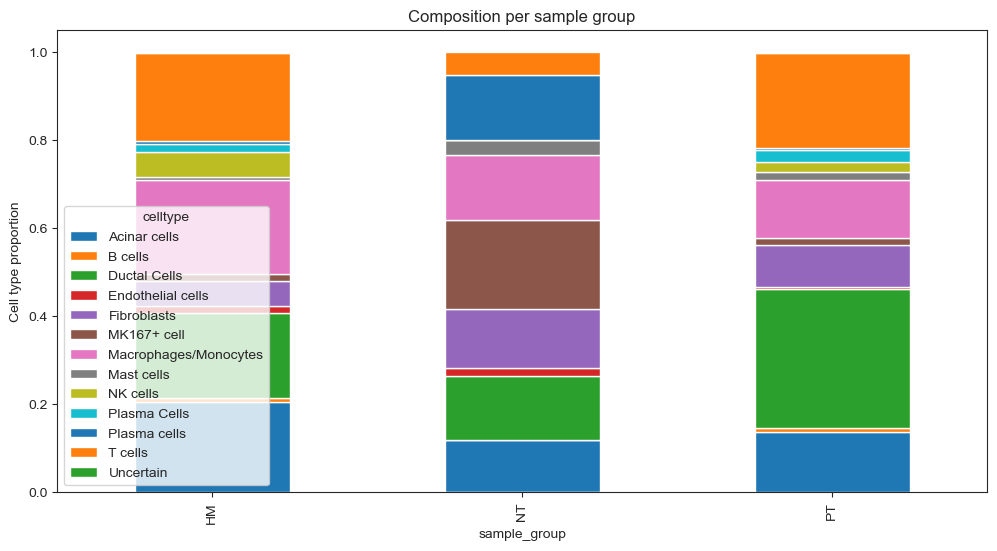

In [219]:
ct_counts = adata.obs.groupby(["sample_group", "celltype"]).size().unstack(fill_value=0)
ct_props = ct_counts.div(ct_counts.sum(axis=1), axis=0)

ct_props.plot(kind="bar", stacked=True, figsize=(12,6))
plt.ylabel("Cell type proportion")
plt.title("Composition per sample group")
plt.show()

In [220]:
cov_df = adata.obs.groupby("sample").first()[["sample_group"]]
print(cov_df)

         sample_group
sample               
case1_yf           PT
case1_zy           HM
case2_zc           NT
case2_yf           PT
case2_zy           HM
case3_yf           PT
case3_zy           HM
case4_zy           HM


In [221]:
data_sccoda = dat.from_scanpy(
    adata,
    cell_type_identifier="celltype",
    sample_identifier="sample",
    covariate_df=cov_df
)
data_sccoda

AnnData object with n_obs × n_vars = 8 × 13
    obs: 'sample_group'
    var: 'n_cells'

In [222]:
model = mod.CompositionalAnalysis(data_sccoda, formula="sample_group")
results = model.sample_hmc()

Automatic reference selection! Reference cell type set to Plasma Cells
Zero counts encountered in data! Added a pseudocount of 0.5.


  0%|          | 0/20000 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1746674509.905640 2192898 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-05-07 23:21:49.914006: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
100%|██████████| 20000/20000 [00:38<00:00, 524.15it/s]


MCMC sampling finished. (48.317 sec)
Acceptance rate: 46.7%


In [224]:
results_df = results.summary()

Compositional Analysis summary:

Data: 8 samples, 13 cell types
Reference index: 9
Formula: sample_group

Intercepts:
                       Final Parameter  Expected Sample
Cell Type                                              
Acinar cells                     1.002      1768.825653
B cells                         -0.958       249.153988
Ductal Cells                     0.918      1626.313592
Endothelial cells               -0.892       266.152947
Fibroblasts                      0.043       677.948369
MK167+ cell                     -0.512       389.191353
Macrophages/Monocytes            1.121      1992.352006
Mast cells                      -0.949       251.406495
NK cells                        -0.258       501.734519
Plasma Cells                    -0.808       289.475635
Plasma cells                    -0.781       297.397948
T cells                          1.079      1910.406131
Uncertain                       -1.784       109.078863


Effects:
                               

No substantial result was found for manual annotation, so trying out automatic annotation labels

In [225]:
adata = ad.concat(adatas, join='outer', label='sample')
adata.obs_names_make_unique()

In [226]:
# Step 1: Normalize to 10,000 counts per cell
sc.pp.normalize_total(adata, target_sum=1e4)

# Step 2: Log1p transform
sc.pp.log1p(adata)

In [227]:
# Add the labels to all genes
predictions = celltypist.annotate(adata, model = 'Immune_All_Low.pkl', majority_voting = True)
predictions

🔬 Input data has 82648 cells and 25875 genes
🔗 Matching reference genes in the model
🧬 5851 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


CellTypist prediction result for 82648 query cells
    predicted_labels: data frame with 3 columns ('predicted_labels', 'over_clustering', 'majority_voting')
    decision_matrix: data frame with 82648 query cells and 98 cell types
    probability_matrix: data frame with 82648 query cells and 98 cell types
    adata: AnnData object referred

In [228]:
# Add predictions to your object (UNCOMMENT WHEN RUNNING FOR THE FIRST TIME)
adata.obs = adata.obs.join(predictions.predicted_labels)

# Prepare to visualize with UMAP
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.6)

In [229]:
adata.obs['sample'].unique()

adata.obs['sample_group'] = adata.obs['sample'].apply(map_sample_to_group)

adata.obs['sample_group'].value_counts()

PT    42625
HM    33417
NT     6606
Name: sample_group, dtype: int64

In [230]:
adata.obs.head()

,n_genes,n_counts,percent_mito,sample,doublet_score,predicted_doublet,predicted_labels,over_clustering,majority_voting,leiden,sample_group
AAACCCAAGAGCACTG-1,946,4039.0,58.133202,case1_yf,0.056846,False,Epithelial cells,218,Epithelial cells,4,PT
AAACCCAAGCTAATCC-1,4845,20821.0,16.502569,case1_yf,0.294118,True,Epithelial cells,43,Epithelial cells,2,PT
AAACCCAAGGCTGTAG-1,3575,12284.0,5.698470,case1_yf,0.028850,False,Epithelial cells,117,Epithelial cells,2,PT
AAACCCAAGTTGAATG-1,1062,3451.0,50.970734,case1_yf,0.045455,False,Epithelial cells,113,Epithelial cells,9,PT
AAACCCACAAACAGGC-1,1772,4832.0,3.849338,case1_yf,0.303406,True,Epithelial cells,37,Epithelial cells,6,PT


In [231]:
cov_df = adata.obs.groupby("sample").first()[["sample_group"]]
print(cov_df)

         sample_group
sample               
case1_yf           PT
case1_zy           HM
case2_zc           NT
case2_yf           PT
case2_zy           HM
case3_yf           PT
case3_zy           HM
case4_zy           HM


In [232]:
data_sccoda = dat.from_scanpy(
    adata,
    cell_type_identifier="majority_voting",
    sample_identifier="sample",
    covariate_df=cov_df
)
data_sccoda

AnnData object with n_obs × n_vars = 8 × 28
    obs: 'sample_group'
    var: 'n_cells'

In [233]:
model = mod.CompositionalAnalysis(data_sccoda, formula="sample_group")
results = model.sample_hmc()

Automatic reference selection! Reference cell type set to Endothelial cells
Zero counts encountered in data! Added a pseudocount of 0.5.


100%|██████████| 20000/20000 [00:39<00:00, 506.78it/s]


MCMC sampling finished. (50.020 sec)
Acceptance rate: 64.1%


In [310]:
results.summary()

Compositional Analysis summary:

Data: 8 samples, 28 cell types
Reference index: 6
Formula: sample_group

Intercepts:
                             Final Parameter  Expected Sample
Cell Type                                                    
Alveolar macrophages                  -0.088       576.880160
CD16+ NK cells                        -1.140       201.468804
CD16- NK cells                        -1.043       221.990491
Classical monocytes                   -1.021       226.928400
DC                                    -1.392       156.590568
DC2                                   -1.182       193.182348
Endothelial cells                     -0.865       265.239860
Epithelial cells                       1.347      2422.691883
Fibroblasts                           -0.488       386.694335
Intermediate macrophages              -0.459       398.072659
Kupffer cells                         -1.762       108.162481
Late erythroid                        -1.865        97.576292
MAIT cells    

In [234]:
results.summary_extended()

Compositional Analysis summary (extended):

Data: 8 samples, 28 cell types
Reference index: 6
Formula: sample_group
Spike-and-slab threshold: 0.847

MCMC Sampling: Sampled 20000 chain states (5000 burnin samples) in 50.020 sec. Acceptance rate: 64.1%

Intercepts:
                             Final Parameter  HDI 3%  HDI 97%     SD  \
Cell Type                                                              
Alveolar macrophages                  -0.058  -0.699    0.496  0.319   
CD16+ NK cells                        -1.132  -1.840   -0.461  0.379   
CD16- NK cells                        -1.038  -1.748   -0.350  0.377   
Classical monocytes                   -0.975  -1.747   -0.274  0.400   
DC                                    -1.388  -2.087   -0.761  0.359   
DC2                                   -1.192  -1.920   -0.563  0.367   
Endothelial cells                     -0.908  -1.610   -0.302  0.352   
Epithelial cells                       1.381   0.955    1.819  0.231   
Fibroblasts     

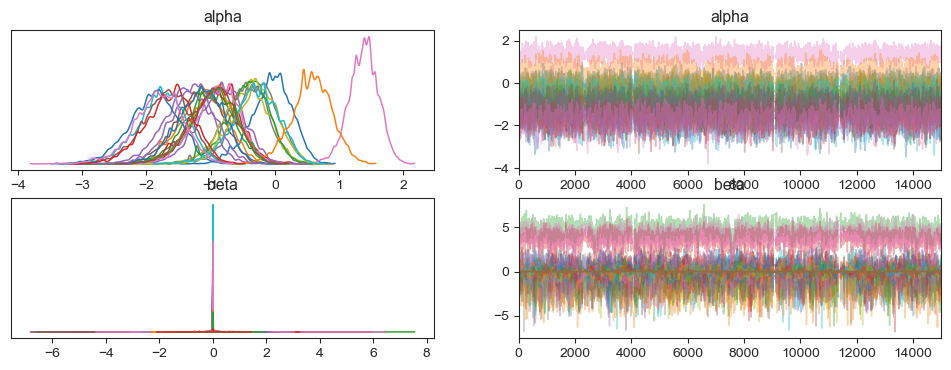

In [235]:
az.plot_trace(
    results,
    divergences=False,
    var_names=["alpha", "beta"],
    coords={"cell_type": results.posterior.coords["cell_type_nb"]},
)
plt.show()

After refering to https://python.arviz.org/en/0.14.0/getting_started/Introduction.html,

The trace plots generated for the parameters "alpha" and "beta" provide a visual representation of the posterior distributions from the Bayesian model. These plots show the sampled values over the course of the MCMC iterations, allowing us to assess the convergence and mixing of the chains. A well-mixed chain indicates that the model has likely converged to the true posterior distribution, while any signs of non-convergence, such as wandering or clumping in the trace, may require further investigation. For "alpha" and "beta", we can observe whether their distributions are symmetric, skewed, or multimodal, which provides insight into the uncertainty of these parameters. Additionally, examining the Effective Sample Size (ESS) and potential autocorrelation within the trace helps ensure that the samples are independent and representative of the posterior. If the chains show good mixing and the distribution appears stable, we can be more confident that the model has accurately captured the uncertainty around the parameters. The lack of divergences further suggests that the model has been well-posed and that the parameter estimates for "alpha" and "beta" are reliable.
